<img src="http://hilpisch.com/tpq_logo.png" alt="The Python Quants" width="35%" align="right" border="0"><br>

# Python for Finance (2nd ed.)

**Mastering Data-Driven Finance**

&copy; Dr. Yves J. Hilpisch | The Python Quants GmbH

<img src="http://hilpisch.com/images/py4fi_2nd_shadow.png" width="300px" align="left">

# Statistics (a)

## Normality Tests

### Benchmark Case

In [1]:
import math
import numpy as np
import scipy.stats as scs
import statsmodels.api as sm
from pylab import mpl, plt

In [2]:
plt.style.use('seaborn')
mpl.rcParams['font.family'] = 'serif'
%matplotlib inline

In [3]:
def gen_paths(S0, r, sigma, T, M, I):
    ''' Generate Monte Carlo paths for geometric Brownian motion.
    
    Parameters
    ==========
    S0: float
        initial stock/index value
    r: float
        constant short rate
    sigma: float
        constant volatility
    T: float
        final time horizon
    M: int
        number of time steps/intervals
    I: int
        number of paths to be simulated
        
    Returns
    =======
    paths: ndarray, shape (M + 1, I)
        simulated paths given the parameters
    '''
    dt = T / M
    paths = np.zeros((M + 1, I))
    paths[0] = S0
    for t in range(1, M + 1):
        rand = np.random.standard_normal(I)
        rand = (rand - rand.mean()) / rand.std()  
        paths[t] = paths[t - 1] * np.exp((r - 0.5 * sigma ** 2) * dt +
                                         sigma * math.sqrt(dt) * rand)  
    return paths

## 生成股价的矩阵。零矩阵->loop->公式计算->结果(股价)填满矩阵。
## rand = (rand - rand.mean()) / rand.std() match fitting的方法来标准化，确保抓的乱数接近于标准正态分布，数据的mean为0，std为1。
## def定义一个函数，后面要算股价就可以带入直接算出结果。

In [4]:
S0 = 100.  
r = 0.05  
sigma = 0.2  
T = 1.0   
M = 50  
I = 250000  
np.random.seed(1000)

## dt就是1/50年，大概一周的时间。

In [5]:
paths = gen_paths(S0, r, sigma, T, M, I)

In [6]:
paths

array([[100.        , 100.        , 100.        , ..., 100.        ,
        100.        , 100.        ],
       [ 97.8209674 , 100.98286801,  99.99884302, ..., 102.16157661,
         96.1055072 ,  98.67253754],
       [ 98.5572741 , 102.83454854, 100.69550621, ..., 103.42799786,
         94.18469905, 100.40798165],
       ...,
       [ 95.4254465 , 120.31589271,  93.76490594, ...,  98.52827376,
         95.31644812, 107.68265055],
       [ 96.42713067, 123.04663105,  90.49932969, ...,  95.65234429,
        102.43685006, 110.02805429],
       [ 96.33862377, 120.61147865,  96.51129499, ...,  93.23436617,
         98.77875561, 107.60096899]])

In [7]:
S0 * math.exp(r * T)  

105.12710963760242

In [8]:
paths[-1].mean()  

105.12645392478755

## 结果基本一致，前面的是S0期初价乘上解除对数形态的一年连续利润率：后面的是模拟结果(一年后股价)的平均数。

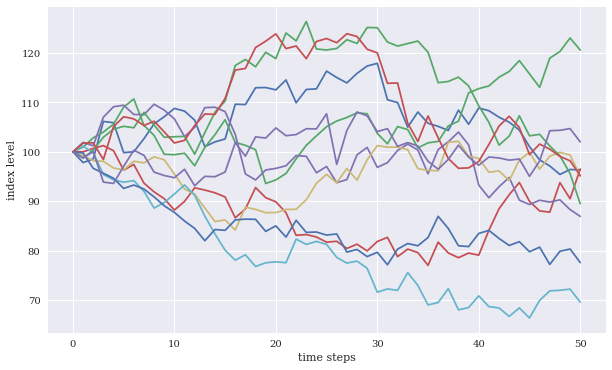

In [9]:
plt.figure(figsize=(10, 6))
plt.plot(paths[:, :10])
plt.xlabel('time steps')
plt.ylabel('index level');
# plt.savefig('../../images/ch13/stat_01.png');

## 抓10条曲线看波动。

In [10]:
paths[:, 0].round(4)

array([100.    ,  97.821 ,  98.5573, 106.1546, 105.899 ,  99.8363,
       100.0145, 102.6589, 105.6643, 107.1107, 108.7943, 108.2449,
       106.4105, 101.0575, 102.0197, 102.6052, 109.6419, 109.5725,
       112.9766, 113.0225, 112.5476, 114.5585, 109.942 , 112.6271,
       112.7502, 116.3453, 115.0443, 113.9586, 115.8831, 117.3705,
       117.9185, 110.5539, 109.9687, 104.9957, 108.0679, 105.7822,
       105.1585, 104.3304, 108.4387, 105.5963, 108.866 , 108.3284,
       107.0077, 106.0034, 104.3964, 101.0637,  98.3776,  97.135 ,
        95.4254,  96.4271,  96.3386])

In [11]:
log_returns = np.log(paths[1:] / paths[:-1]) 

In [12]:
log_returns[:, 0].round(4)

array([-0.022 ,  0.0075,  0.0743, -0.0024, -0.059 ,  0.0018,  0.0261,
        0.0289,  0.0136,  0.0156, -0.0051, -0.0171, -0.0516,  0.0095,
        0.0057,  0.0663, -0.0006,  0.0306,  0.0004, -0.0042,  0.0177,
       -0.0411,  0.0241,  0.0011,  0.0314, -0.0112, -0.0095,  0.0167,
        0.0128,  0.0047, -0.0645, -0.0053, -0.0463,  0.0288, -0.0214,
       -0.0059, -0.0079,  0.0386, -0.0266,  0.0305, -0.0049, -0.0123,
       -0.0094, -0.0153, -0.0324, -0.0269, -0.0127, -0.0178,  0.0104,
       -0.0009])

## 算连续平均数，paths[1:] / paths[:-1]就是当前列一直抓到倒数第二列，之前的股价矩阵是51 * 250000，而shift之后形成的矩阵，计算出的结果会少一个shift的量，结果是50 * 250000.

## describe是描述性统计，定义一个函数，print出描述性统计的部分内容通过%14s %15.5f' % 的方式；% ('size', sta[0])可以同时输出str和float形式的value。

In [13]:
def print_statistics(array):
    ''' Prints selected statistics.
    
    Parameters
    ==========
    array: ndarray
        object to generate statistics on
    '''
    sta = scs.describe(array)
    print('%14s %15s' % ('statistic', 'value'))
    print(30 * '-')
    print('%14s %15.5f' % ('size', sta[0]))
    print('%14s %15.5f' % ('min', sta[1][0]))
    print('%14s %15.5f' % ('max', sta[1][1]))
    print('%14s %15.5f' % ('mean', sta[2]))
    print('%14s %15.5f' % ('std', np.sqrt(sta[3])))
    print('%14s %15.5f' % ('skew', sta[4]))
    print('%14s %15.5f' % ('kurtosis', sta[5]))

In [14]:
print_statistics(log_returns.flatten())

     statistic           value
------------------------------
          size  12500000.00000
           min        -0.15664
           max         0.15371
          mean         0.00060
           std         0.02828
          skew         0.00055
      kurtosis         0.00085


## 周利率(1年分为50份)最低 -0.15664，最高0.15371，有对称性，mean在0.00060靠近0.

## 结果是离散化后的(间断时间的)报酬率

In [15]:
math.exp(0.15371) - 1

0.1661526534674742

In [16]:
math.exp(- 0.15664) - 1

-0.14498819232967075

## 连续时间的报酬率(ln(St/S0))通常是小于等于离散化后的(间断时间)的报酬率
## 1 + r间 = e^r连，r连 = ln(1 + r间)，因为连续时间的报酬率获得的是ln(St/S0)的式子，所以要转变成百分比的报酬率，需要去掉ln再减1.而间断时间(离散化后)的报酬率在每个间断点处都做过了这样的操作，所以相加的时候不会出现需要转变的情况。(前提是两个都是一年为基准来计算复利，并且在年末进行连续时间报酬率的计算)。

In [17]:
log_returns.shape

(50, 250000)

## log_returns.flatten()将二维的矩阵摊平，去掉多余的[]，变成一个array，可以直接输入之前定义的函数。

## 推导过程
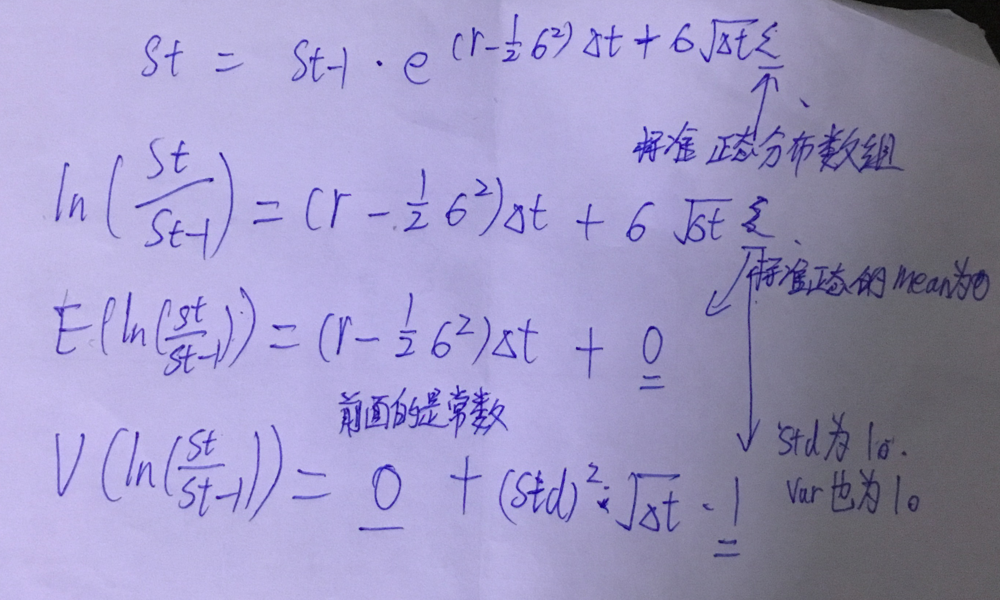

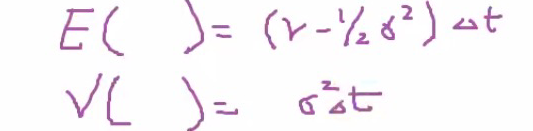

## 股价数组的平均值和方差是由r(无风险利率)和σ(波动率)决定的。反向求出这两个数和之前设置的值做对比，基本上没有差别。dt = 1/50 = 1/M。
## σ和σ^2都是对的，看设置，一般σ是平方过的值，所以直接使用σ * Δt就行了。

In [18]:
log_returns.mean() * M + 0.5 * sigma ** 2  

0.05000000000000006

In [19]:
log_returns.std() * math.sqrt(M)  

0.20000000000000015

In [20]:
plt.hist?

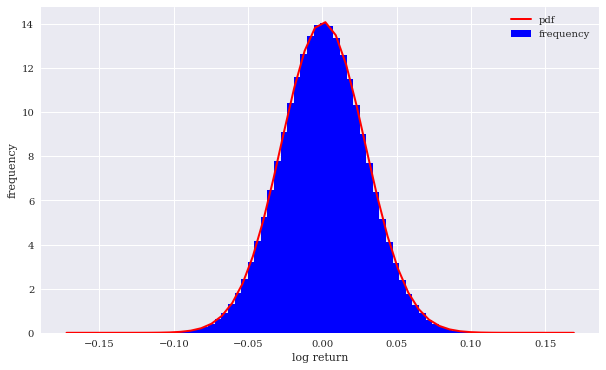

In [21]:
plt.figure(figsize=(10, 6))
plt.hist(log_returns.flatten(), bins=70, density=True,
         label='frequency', color='b')
plt.xlabel('log return')
plt.ylabel('frequency')
x = np.linspace(plt.axis()[0], plt.axis()[1])
plt.plot(x, scs.norm.pdf(x, loc = (r - 0.5 * sigma ** 2) / M, scale = sigma / np.sqrt(M)),
         'r', lw=2.0, label='pdf')  
plt.legend();
# plt.savefig('../../images/ch13/stat_02.png');

## 关于离散化后的报酬率(当期股价除以前一期股价)数组做hist, density = True,蓝色部分面积加总变为1，因为是离散化后的，所以和连续的数组(红线)之间有差距，画图时候可以调整。

## 第一个hist不需要取点是因为hist本身只需要取bins的大小就行了，而第二天曲线是需要输入x和y值的，x就是等分出来的数组，从数组的最小值到最大值，而y值直接使用了scs.norm.pdf(Probability density function)生成符合hist数组的平均值和std(标准差)的正态分布的概率密度函数(曲线下所有面积相加为1)。
## pdf是概率密度函数值，而cdf(Cumulative distribution function)是累计分布函数，前者是norm(正态分布)的一种(需要输入分布的平均数和标准差)，后者是对任意分布的累计(需要输入累计的分布数组)。
## plt.axis()[0], plt.axis()[1]是将横坐标最大和最小值取出(先要画出hist之后再做)取出，plt.axis后面两个数是y值的最大和最小值。
## x = np.linspace(plt.axis()[0], plt.axis()[1])从最大到最小等分的取50个数(linespace默认是50个点)
## scs.norm.pdf(x, loc = (r - 0.5 * sigma ** 2) / M, scale=sigma / np.sqrt(M)):pdf函数需要输入要求的点的数组，loc是平均数，scale是标准差。

In [22]:
scs.norm.cdf?

## flatten将(50, 250000)的矩阵摊开成12500000 * 1的array。
## log_returns.flatten()[::500]是将数据摊平之后，格500个抓一个数从12500000个数里面抓出25000个数。[::]一定要是双::之后再写间隔的数值。

In [23]:
log_returns.shape

(50, 250000)

In [24]:
log_returns.flatten().shape

(12500000,)

In [25]:
log_returns.flatten()[::500].shape

(25000,)

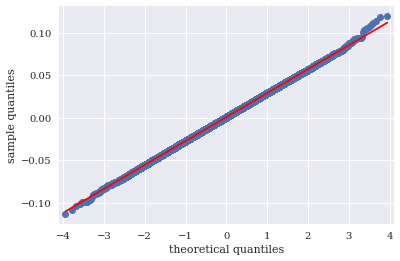

In [26]:
sm.qqplot(log_returns.flatten()[::500], line='s')
plt.xlabel('theoretical quantiles')
plt.ylabel('sample quantiles');
# plt.savefig('../../images/ch13/stat_03.png');

## qqplot的横轴是理论上的正态分布数据分布状况(cdf累加)，而竖轴是实际上分布状况，实际上就是测试数组和正态分布之间的差距。横轴的1代表在平均数0的基础上增加一个标准差(标准正态分布的标准差为1)，而这一数值对应的y值是在实际上的数组当中对应的位置。
## 例：x轴取1，把1带入用需要测试的分布拟合出的同样的x轴的标准正态分布(类似于画图中的pdf红线)，获得一个y值(在红线上的)，然后返回实际的数组，找这个值对应的x轴位置(在实际分布的概率分布函数上)，这个值就是在qqplot里面，x取1时y的值。
## 所以有两个类型的ggplot，一个是y轴值做过标准化的(变成-1，0，1的形式的)，一个是直接使用实际概率分布函数x轴原值的。前者主要使用于早期，方便计算。
## 如果完全符合标准正态分布，qqline就会是一条从0到最大值的一条45度的斜线(对角线)。
## 按标准差度量对应方式，因为实际数组的标准差是0.02828，所以如果x轴取1(和mean0差一个标准差)的时候，y值取0.02828，就说明这个数组是基本上是符合标准正态分布的(反向验证)。从图中看，大致符合。

In [27]:
def normality_tests(arr):
    ''' Tests for normality distribution of given data set.
    
    Parameters
    ==========
    array: ndarray
        object to generate statistics on
    '''
    print('Skew of data set  %14.3f' % scs.skew(arr))
    print('Skew test p-value %14.3f' % scs.skewtest(arr)[1])
    print('Kurt of data set  %14.3f' % scs.kurtosis(arr))
    print('Kurt test p-value %14.3f' % scs.kurtosistest(arr)[1])
    print('Norm test p-value %14.3f' % scs.normaltest(arr)[1])

In [28]:
scs.skewtest(log_returns.flatten())  

SkewtestResult(statistic=0.7892696918155548, pvalue=0.42995439684794856)

In [29]:
scs.normaltest(log_returns.flatten()) 

NormaltestResult(statistic=0.9972829322708627, pvalue=0.607355212118118)

In [30]:
scs.normaltest?

## 定义一个函数，用来测试常态性，scs.skew偏态，scs.skewtest()里面包含两个值一个是z-score和一个p-value,[1]就是看第二个数p_value。
## scs.kurtosis峰度，scs.kurtosistest(arr)[1]也是取第二个p_value(第一个也是z-score).
## scs.normaltest(arr)[1]常态性检测，取第二个p_value(第一个也是z-score).
## 所有test得出的p_value都是和标准正态分布做对比，p_value就是有多大的可能性拒绝虚无假设，可以相信和标准正态分布是一致的，skewtest和kurtosistest就是在偏态和峰度两个方面和标准正态分布对比。
## p-value的值一般取0.05做标准，小于代表无法拒绝虚无假设/否定假设(这个数组分布和标准正态分布是不一致的)，大于代表可以拒绝，反过来代表一定程度上具有一致性(统计中，只能说概率，或者对反向的事件的否定，往往无法直接得出这个事件本身一定发生)。无法拒绝不代表接受数组和标准正态分布完全一致。

In [31]:
normality_tests(log_returns.flatten())  

Skew of data set           0.001
Skew test p-value          0.430
Kurt of data set           0.001
Kurt test p-value          0.541
Norm test p-value          0.607


In [32]:
paths[-1].shape

(250000,)

## 之前是50个期间的数据都计入，然后画hist图；后面是单独取出最后一期的数据做hist。看最后的结果(1年时间)取log之后的结果，1年后的非离散化/连续结果的数组是否符合标准正态分布。

Text(0.5, 1.0, 'log data')

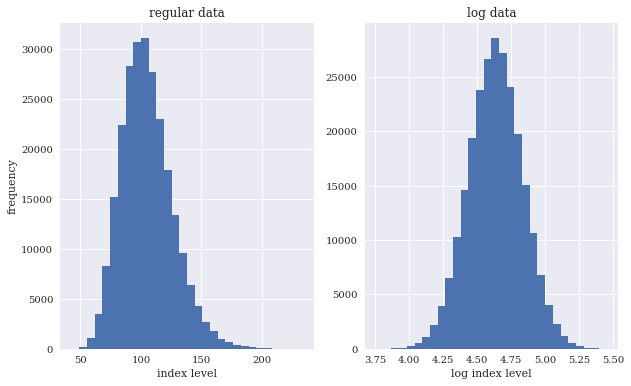

In [33]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))
ax1.hist(paths[-1], bins=30)
ax1.set_xlabel('index level')
ax1.set_ylabel('frequency')
ax1.set_title('regular data')
ax2.hist(np.log(paths[-1]), bins=30)
ax2.set_xlabel('log index level')
ax2.set_title('log data')
# plt.savefig('../../images/ch13/stat_04.png');

## f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))开一个画布，里面2个子图ax1, ax2
## 前面一个是直接画St/S0报酬率的结果，后面一个是ln(St/S0)的结果。

In [34]:
print_statistics(paths[-1])

     statistic           value
------------------------------
          size    250000.00000
           min        42.74870
           max       233.58435
          mean       105.12645
           std        21.23174
          skew         0.61116
      kurtosis         0.65182


In [35]:
S0 * np.exp(0.05 * T)

105.12710963760242

In [36]:
print_statistics(np.log(paths[-1]))

     statistic           value
------------------------------
          size    250000.00000
           min         3.75534
           max         5.45354
          mean         4.63517
           std         0.19998
          skew        -0.00092
      kurtosis        -0.00327


## skew和kurtosis在标准正态分布的情况下为0

In [37]:
np.log(S0) + (r - 0.5 * sigma ** 2)

4.635170185988092

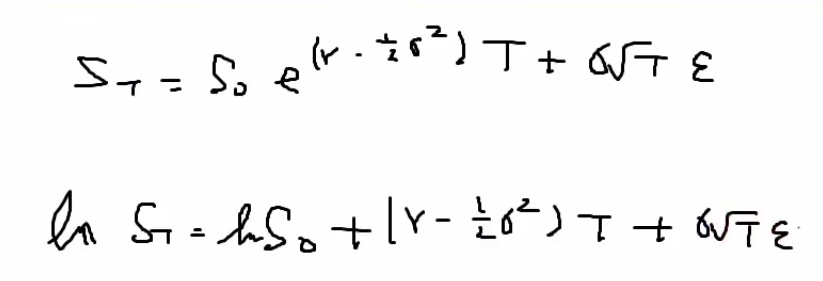

In [38]:
normality_tests(np.log(paths[-1]))

Skew of data set          -0.001
Skew test p-value          0.851
Kurt of data set          -0.003
Kurt test p-value          0.744
Norm test p-value          0.931


## 验证结果，没有取ln的报酬率St/S0是在mean上比较接近平均值S0 * np.exp(0.05 * T)，但是kurtosis和skew都严重超出标准正态分布；
## 而取了ln之后的数组mean上更加接近平均值np.log(S0) + (r - 0.5 * sigma ** 2)，而且在kurtosis和skew上都很接近0，代表接近标准正态分布，看检测出的p_value也有这个特点，非常接近1，代表距离0.05这个标准很远，很大程度上能够否定虚无假设，基本上确定数组和标准正态分布一致。

(3.577027338543009, 5.631854702683424, 0.0, 2.1259631228569913)


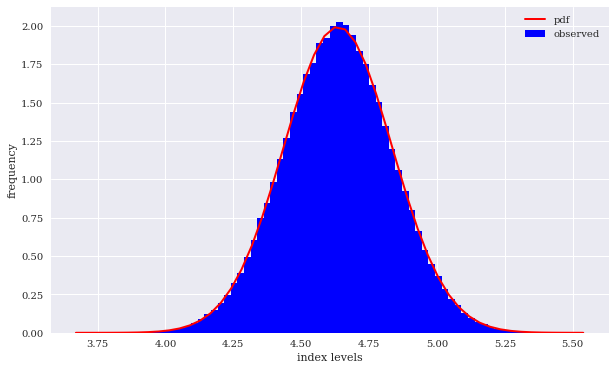

In [39]:
plt.figure(figsize=(10, 6))
log_data = np.log(paths[-1])
plt.hist(log_data, bins=70, density=True,
         label='observed', color='b')
plt.xlabel('index levels')
plt.ylabel('frequency')
x = np.linspace(plt.axis()[0], plt.axis()[1])
plt.plot(x, scs.norm.pdf(x, log_data.mean(), log_data.std()),
         'r', lw=2.0, label='pdf')
plt.legend();
print(plt.axis())
# plt.savefig('../../images/ch13/stat_05.png');

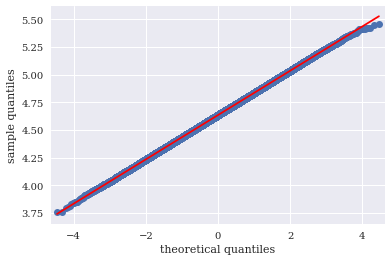

In [40]:
sm.qqplot(log_data, line='s')
plt.xlabel('theoretical quantiles')
plt.ylabel('sample quantiles');
# plt.savefig('../../images/ch13/stat_06.png');

## 看hist和qqplot，比较明显，相比之前的将全部50期的值都输入的数组，单独取出最后一年数据划出的图像更加趋向于标准正态分布。
## 从之前算出的test值也证明了这一点。

### Real World Data

In [41]:
import pandas as pd

In [42]:
raw = pd.read_csv('./source/tr_eikon_eod_data.csv',
                 index_col=0, parse_dates=True).dropna()

## index_col=0列columns的标签为第0列的名称，parse_dates=True将columns里面的数变成时间的格式
## .dropna()去掉空值。

In [43]:
raw

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2010-01-04,30.572827,30.950,20.88,133.90,173.08,113.33,1132.99,20.04,1.4411,1120.00,47.71,109.80
2010-01-05,30.625684,30.960,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.70
2010-01-06,30.138541,30.770,20.80,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.50,49.34,111.51
2010-01-07,30.082827,30.452,20.60,130.00,177.67,114.19,1141.69,19.06,1.4318,1131.90,49.10,110.82
2010-01-08,30.282827,30.660,20.83,133.52,174.31,114.57,1144.98,18.13,1.4412,1136.10,49.84,111.37
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-25,182.170000,98.390,50.71,1663.15,221.54,271.00,2717.07,17.33,1.1702,1265.00,22.01,119.89
2018-06-26,184.430000,99.080,49.67,1691.09,221.58,271.60,2723.06,15.92,1.1645,1258.64,21.95,119.26
2018-06-27,184.160000,97.540,48.76,1660.51,220.18,269.35,2699.63,17.91,1.1552,1251.62,21.81,118.58


In [44]:
symbols = ['SPY', 'GLD', 'AAPL.O', 'MSFT.O']

In [45]:
data = raw[symbols]
data = data.dropna()

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2138 entries, 2010-01-04 to 2018-06-29
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SPY     2138 non-null   float64
 1   GLD     2138 non-null   float64
 2   AAPL.O  2138 non-null   float64
 3   MSFT.O  2138 non-null   float64
dtypes: float64(4)
memory usage: 83.5 KB


In [47]:
data.head()

,SPY,GLD,AAPL.O,MSFT.O
Date,,,,
2010-01-04,113.33,109.80,30.572827,30.950
2010-01-05,113.63,109.70,30.625684,30.960
2010-01-06,113.71,111.51,30.138541,30.770
2010-01-07,114.19,110.82,30.082827,30.452
2010-01-08,114.57,111.37,30.282827,30.660


## 将['SPY', 'GLD', 'AAPL.O', 'MSFT.O']4列(4个股票指数)抽出来，形成data。
## raw[symbols]抽取dataframe里面的数组。

<AxesSubplot:xlabel='Date'>

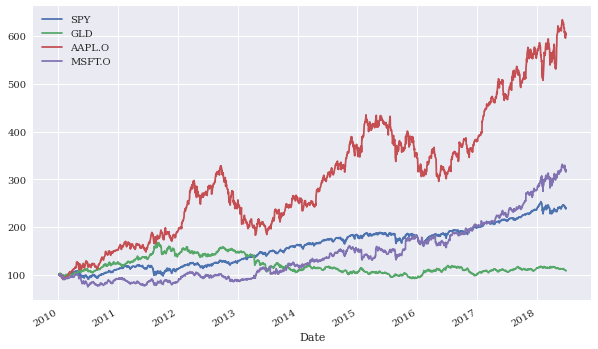

In [48]:
(data / data.iloc[0] * 100).plot(figsize=(10, 6))
# plt.savefig('../../images/ch13/stat_07.png');

## data / data.iloc[0] * 100标准化，将S0统一变成100.
## data / data.iloc[0]：dataframe/array，通过广播的方式，是S0的值变成1.，然后再* 100。

In [49]:
log_returns = np.log(data / data.shift(1))
log_returns.head()

,SPY,GLD,AAPL.O,MSFT.O
Date,,,,
2010-01-04,NaN,NaN,NaN,NaN
2010-01-05,0.002644,-0.000911,0.001727,0.000323
2010-01-06,0.000704,0.016365,-0.016034,-0.006156
2010-01-07,0.004212,-0.006207,-0.001850,-0.010389
2010-01-08,0.003322,0.004951,0.006626,0.006807


## 日报酬率就是当天价格除以昨天价格，通过shift(1)，向前取一个位置后的数(昨天价格). 第1列出现空值。

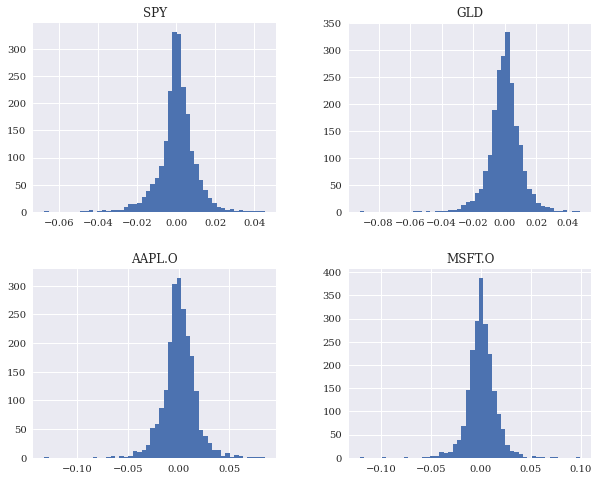

In [50]:
log_returns.hist(bins=50, figsize=(10, 8));
# plt.savefig('../../images/ch13/stat_08.png');

## 画图，看不同时间的日报酬率是否是符合正态分布。总体上符合长尾和高峰的金融数据的特性。

In [51]:
for sym in symbols:
    print('\nResults for symbol {}'.format(sym))
    print(30 * '-')
    log_data = np.array(log_returns[sym].dropna())
    print_statistics(log_data)  


Results for symbol SPY
------------------------------
     statistic           value
------------------------------
          size      2137.00000
           min        -0.06734
           max         0.04545
          mean         0.00041
           std         0.00933
          skew        -0.52189
      kurtosis         4.52432

Results for symbol GLD
------------------------------
     statistic           value
------------------------------
          size      2137.00000
           min        -0.09191
           max         0.04795
          mean         0.00004
           std         0.01020
          skew        -0.59934
      kurtosis         5.68423

Results for symbol AAPL.O
------------------------------
     statistic           value
------------------------------
          size      2137.00000
           min        -0.13187
           max         0.08502
          mean         0.00084
           std         0.01591
          skew        -0.23510
      kurtosis         4.7

## for sym in symbols:写个简单的loop，将4个数组的正态化检验的值打印出来。
## {}'.format(sym)相当于是%', %sym.
## log_returns[sym].dropna()直接引用出之前得出的日报酬率矩阵，并且做了去空值。
## 看数据，连续时间的报酬率要高于间断时间的报酬率。跌的极端值往往比涨的极端值要高得多。

In [52]:
log = log_returns.dropna()
log

,SPY,GLD,AAPL.O,MSFT.O
Date,,,,
2010-01-05,0.002644,-0.000911,0.001727,0.000323
2010-01-06,0.000704,0.016365,-0.016034,-0.006156
2010-01-07,0.004212,-0.006207,-0.001850,-0.010389
2010-01-08,0.003322,0.004951,0.006626,0.006807
2010-01-11,0.001396,0.013202,-0.008861,-0.012802
...,...,...,...,...
2018-06-25,-0.013706,-0.003746,-0.014983,-0.020323
2018-06-26,0.002212,-0.005269,0.012330,0.006988
2018-06-27,-0.008319,-0.005718,-0.001465,-0.015665


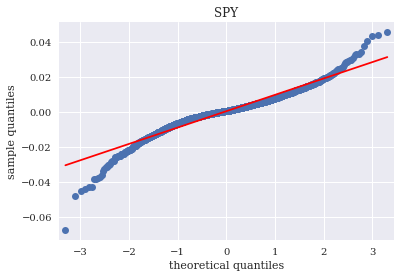

In [53]:
sm.qqplot(log['SPY'], line='s')
plt.title('SPY')
plt.xlabel('theoretical quantiles')
plt.ylabel('sample quantiles');
# plt.savefig('../../images/ch13/stat_09.png');

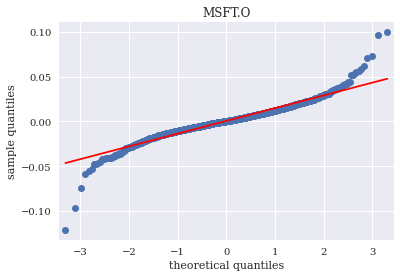

In [54]:
sm.qqplot(log['MSFT.O'], line='s')
plt.title('MSFT.O')
plt.xlabel('theoretical quantiles')
plt.ylabel('sample quantiles');
# plt.savefig('../../images/ch13/stat_10.png');

## qqplot总体上比较符合，但是一头一尾，分别在线之下和线之上，说明数据有厚尾的特征(左部的更加明显，因为跌要比涨更加极端和高频）

In [55]:
for sym in symbols:
    print('\nResults for symbol {}'.format(sym))
    print(32 * '-')
    log_data = np.array(log_returns[sym].dropna())
    normality_tests(log_data)  


Results for symbol SPY
--------------------------------
Skew of data set          -0.522
Skew test p-value          0.000
Kurt of data set           4.524
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol GLD
--------------------------------
Skew of data set          -0.599
Skew test p-value          0.000
Kurt of data set           5.684
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol AAPL.O
--------------------------------
Skew of data set          -0.235
Skew test p-value          0.000
Kurt of data set           4.790
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol MSFT.O
--------------------------------
Skew of data set          -0.091
Skew test p-value          0.085
Kurt of data set           7.291
Kurt test p-value          0.000
Norm test p-value          0.000


## skew偏态和Kurt峰度都比较大，距离0比较远，p-value是0，小于0.05，表明接受了拒绝(虚无)假设，数组和标准正态分布不一致。
## skew偏态和Kurt峰度和0的距离到底算不算大还需要考虑数据结构，如果是分布的峰度不高的情况下，同样的偏态值和0的差距就可能认定为不大(p-value大于0.05)。
## MSFT.O的情况比较特殊，单从shew(偏态)上看p_value是0.085大于0.05，是可以一定程度否定虚无假设，意思是从shew上看，结果和标准正态分布的shew还是贴近的。但是不等同于shew的值和标准正态分布的shew值一致。
## 从hist上看，确实分布比较居中在0附近，但是kurt峰态的值过高了，所以综合性看Norm test p-value还是否定了一致性。

## 学术上，有一种说法，从当天看都是标准正态分布，但是在每个点处当天过后标准差和平均数就可能改变，在一个点处多个可能的标准差不同的正态分布累加起来就出现了厚尾的正态分布。

# Portfolio Optimization投资组合最优化

### The Data

In [56]:
symbols = ['AAPL.O', 'MSFT.O', 'SPY', 'GLD']  

In [57]:
noa = len(symbols)  

In [58]:
data = raw[symbols]

In [59]:
rets = np.log(data / data.shift(1))

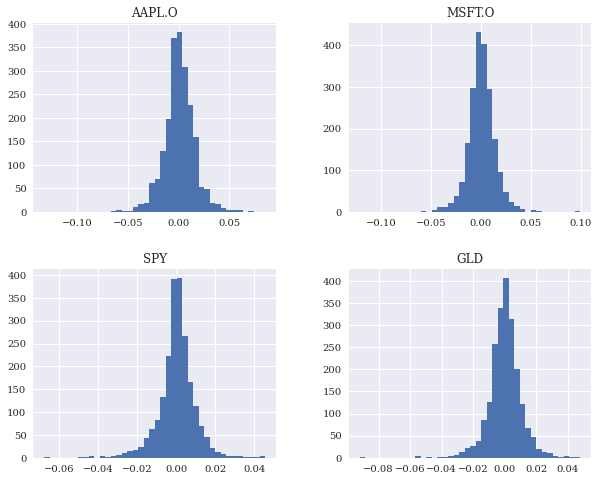

In [60]:
rets.hist(bins=40, figsize=(10, 8));
# plt.savefig('../../images/ch13/stat_11.png')

In [61]:
rets.mean() * 252  

AAPL.O    0.212359
MSFT.O    0.136648
SPY       0.102928
GLD       0.009141
dtype: float64

In [62]:
np.exp(0.212359) - 1

0.2365917418367678

## 0.2365917418367678是算出的连续时间的利率，是大于间断时间的(离散化后的)0.212359的。
## 这个数是比较高的报酬率水平

## .mean()默认按y轴计算，每一列出一个mean值。

In [63]:
rets.cov() * 252  

,AAPL.O,MSFT.O,SPY,GLD
AAPL.O,0.063773,0.023427,0.021039,0.001513
MSFT.O,0.023427,0.050917,0.022244,-0.000347
SPY,0.021039,0.022244,0.021939,0.000062
GLD,0.001513,-0.000347,0.000062,0.026209


In [64]:
rets.cov?

In [65]:
rets.cov()

,AAPL.O,MSFT.O,SPY,GLD
AAPL.O,0.000253,0.000093,8.348619e-05,6.002633e-06
MSFT.O,0.000093,0.000202,8.826834e-05,-1.376963e-06
SPY,0.000083,0.000088,8.705878e-05,2.470088e-07
GLD,0.000006,-0.000001,2.470088e-07,1.040027e-04


## 因为连续时间的报酬率是ln的形式是可以直接相加的，为了算出的年化报酬率是平均水平，需要先对算出的日报酬率做mean，然后乘上252.
## cov计算的是协方差，输出一个方差矩阵，正对角线是自己对自己(方差大小），其他地方是x和y轴对应数组之间的协方差。乘上252变成年报酬率方差矩阵，(var * dt).
## 使用252是因为工作日大概是252，用工作日(交易日)，不用自然日.（因为交易对资产造成的波动是影响价格的核心，剔除其他小的影响，只研究交易的影响(只使用交易日)）

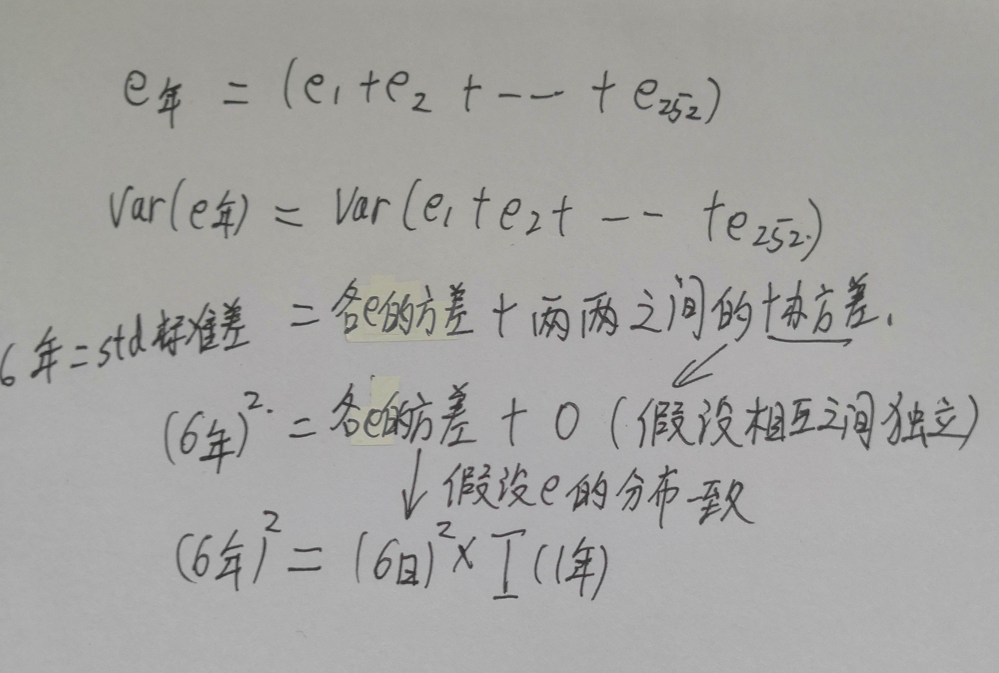

## 正态分布经常在金融里面使用，是因为只需要关注前两个动差(矩)就可以把分布的所有动差(矩)描绘出来。

# The Basic Theory

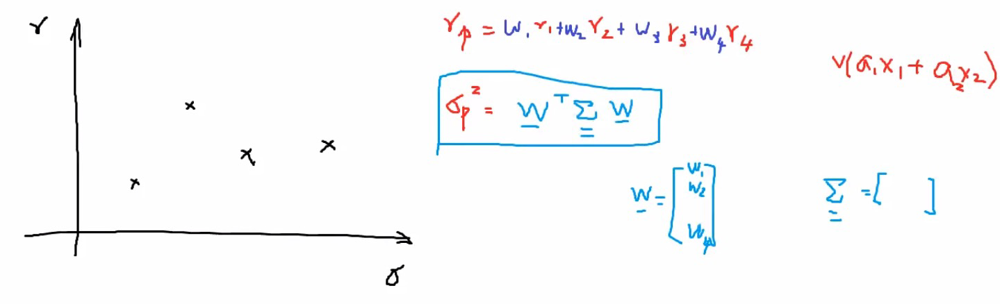

In [66]:
weights = np.random.random(noa)  
weights /= np.sum(weights)  

In [67]:
weights

array([0.07650728, 0.06021919, 0.63364218, 0.22963135])

## 通过np.random.random来给每个股票赋值(产生的是0到1之间的正数小数)。
## 权重为正说明不存在做空。
## 通过weight可以产生无穷多个投资组合方案。

In [68]:
weights.sum()

1.0

## 标准化，weights /= np.sum(weights)就是weights = weights/np.sum(weights)，使加总起来为1

In [69]:
rets.mean()

AAPL.O    0.000843
MSFT.O    0.000542
SPY       0.000408
GLD       0.000036
dtype: float64

In [70]:
np.sum(rets.mean() * weights) * 252  

0.09179459482057789

In [71]:
np.dot(weights, np.dot(rets.cov() * 252, weights.T))  

0.01476328866648557

In [72]:
rets.cov() * 252

,AAPL.O,MSFT.O,SPY,GLD
AAPL.O,0.063773,0.023427,0.021039,0.001513
MSFT.O,0.023427,0.050917,0.022244,-0.000347
SPY,0.021039,0.022244,0.021939,0.000062
GLD,0.001513,-0.000347,0.000062,0.026209


In [73]:
weights

array([0.07650728, 0.06021919, 0.63364218, 0.22963135])

In [74]:
np.dot(rets.cov() * 252, weights)

array([0.01996812, 0.01887333, 0.01686474, 0.00615261])

In [75]:
weights.T

array([0.07650728, 0.06021919, 0.63364218, 0.22963135])

## rets.mean() * weights是array * array, 获得的是给每个资产赋予权重之后的值的数列 ，然后进行加总(4个资产组成的投资组合的日报酬率)，乘上252(变成年报酬率)。
## 算σ，需要rets.cov() * 252(加总后的σ，写作Σ)、weights和weights.T,因为weight是横向的数列，通过dot将两个两个乘起来，weights.T和weights先后顺序不重要，主要是要使Σ与weights和weights.T都乘过(weights.T是weights和weights的转置，实际上就是将横着的weights竖起来).

In [76]:
math.sqrt(np.dot(weights.T, np.dot(rets.cov() * 252, weights)))

0.12150427427249451

## 开根号得std(标准差)

In [77]:
def port_ret(weights):
    return np.sum(rets.mean() * weights) * 252

In [78]:
def port_vol(weights):
    return np.sqrt(np.dot(weights.T, np.dot(rets.cov() * 252, weights)))

## 将标准差和平均数的计算方法写成程序函数，下次可以直接调用。

In [79]:
prets = []
pvols = []
for p in range (2500):  
    weights = np.random.random(noa)  
    weights /= np.sum(weights)  
    prets.append(port_ret(weights))  
    pvols.append(port_vol(weights))  
prets = np.array(prets)
pvols = np.array(pvols)

## 抽2500个weights(每个都是通过np.random.random生成，同时经过/= np.sum(weights)标准化，使相加为1，.append往之前设定为空的[]list里面输入值(值来自于之前定义的port_ret和port_vol函数计算))，np.array变list为np.array的形式

In [80]:
prets.shape

(2500,)

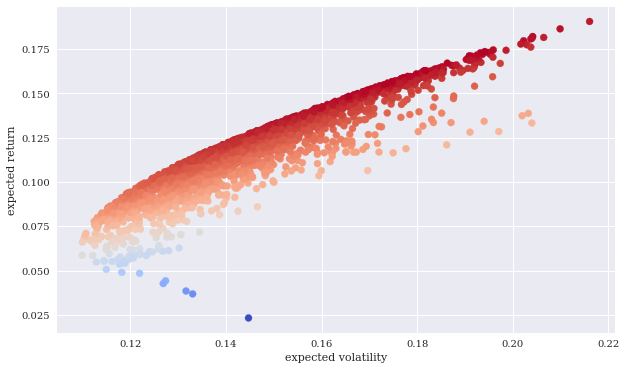

In [81]:
plt.figure(figsize=(10, 6))
plt.scatter(pvols, prets, c=prets / pvols,
            marker='o', cmap='coolwarm')
plt.xlabel('expected volatility')
plt.ylabel('expected return')
cmap='coolwarm';
# plt.savefig('../../images/ch13/stat_12.png')

## 画散点分布图，pvols, prets为x,y轴坐标值，c=prets / pvols + cmap='coolwarm'设定渐变色的颜色和参照的数值，cmap='coolwarm'显示colorbar，同时输出bar的title。

## 上面的图是基于4个投资物延伸出的不同的weights而得到的2500个投资组合(衍生品方案portfolio)，横轴和纵轴代表风险和收益，而风险收益比高的投资组合方案是想获得的那一部分。
## 就是prets / pvols，就是单位风险的收益，越高代表这个组合的效率越高(风险少，回报高)。
## 图中红色部分是colorbar上高于0.5的点(colorbar默认将数值区间设定为0到1，所以更多的是看相对水平，0.5以上代表高于(max + min)/2的值, 代表相对较高的值)，这些点的代表相对较好的风险收益比，红色越深代表越优秀的风险收益比。

## 采用的风险收益比prets / pvols类似于Sharpe ratio夏普比率 ：一项投资（例如证券或投资组合）在对其调整风险后，相对于无风险资产的表现。Sharpe ratio是投资收益与无风险收益之差的期望值，再除以投资标准差（即其波动性）。它代表投资者额外承受的每一单位风险所获得的额外收益。
## Sharpe ratio的调整是(prets - r) / pvols（r为无风险利率）。

## 从图中可以看到，如果将红色点外缘形成的弧线与原点相连，形成一条弧线，在弧线上，越靠近原点越淡(值越小)，越远离原点，颜色越深(值越大)。(图里面原点不在画幅里面，在画幅左边)

# Portfolio Optimizations投资组合最优化(Sharpe ratio)

In [82]:
import scipy.optimize as sco

In [83]:
def min_func_sharpe(weights):  
    return -port_ret(weights) / port_vol(weights)  

## 在做最值问题时，往往采用加负号，改成极小化的问题(开口向下刚好控制，确定最值)
## -port_ret(weights) / port_vol(weights)求极小值。
## 结合之前画出的scatter，红点聚集的区域可以近似看作一条从0延伸出来的一条斜率为k的直线
## 直线方程：y = prets/pvols * x(k = y.mean / x.mean), 或者看作曲线，每个点的斜率(一阶导值)为dy/dx。
## 前提是不考虑r无风险利率，或无风险利率为0，所以Sharpe ratio为prets / pvols，拟合出的直线的截距为0，从原点出发。这种情况下，Sharpe ratio就可以近似为k值。

In [113]:
 cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})  

In [114]:
type(cons)

dict

## 开一个字典，写入限制式，形成一个function的定义式, 输入sco.minimize函数里面，命名为constraints可以用来限制最值化的选择变量的结果。(当前每被使用时还是一个dist，实际上也可以在写sco.minimize函数的时候再写)
## 'type': 'eq'代表结果是等于0， 'fun': lambda x:  np.sum(x) - 1，fun后面写函数的本体，定义输入的x值，lambda写式子，后面是np.sum(x) - 1，相当于加总之后减1要等于0，代表使用上的数组最后加总之后的结果应该是1. 除此之外，还可以定义jac,Jacobian值。

In [115]:
bnds = tuple((0, 1) for x in range(noa))  

## bnds = tuple((0, 1) for x in range(noa))代表权重的值只能是0到1之间(包括0和1)，限制之后的权重不能出现负数和超过1的数，意味着不可以做空(如做空一笔-0.3，代表先拿到0.3份额的一支股票的现金(做空是先借入标的资产，然后卖出获得现金，过一段时间之后，再支出现金买入标的资产归还), 这样用来投资的现金就增加了，这就意味着在加总等于1的前提下，最多单项投入可以达到1.3的份额)。
## 也可以给上限改变为0.1，因为对于商业银行的每只公募理财产品持有单只证券或单只公募证券投资基金的市值不得超过该理财产品净资产的10%；不同金融机构发行的不同金融衍生品(基于股票，证券)是有不同的上限。

In [116]:
bnds

((0, 1), (0, 1), (0, 1), (0, 1))

## tuple((0, 1)本身代表一个区间，通过for x in range(noa)生成来生成noa个(0, 1)的区间。(也是一个赋值的过程)。

In [117]:
eweights = np.array(noa * [1. / noa])  
eweights  

array([0.25, 0.25, 0.25, 0.25])

In [118]:
eweigh = np.array(noa * [1. / noa, 1.])  
eweigh  

array([0.25, 1.  , 0.25, 1.  , 0.25, 1.  , 0.25, 1.  ])

In [119]:
eweight = noa * np.array([1. / noa])  
eweight  

array([1.])

## noa * [1. / noa]代表生成4个1/noa值的list，因为list里面是不支持向量化运算的，所以4 * []就是组成新的list，list是有4个之前[]里面的内容合成出的内容(顺序是按照[]里面内容的排列顺序组合出来的)，随后再生产array，方便后面计算。
## 设置等权重作为一个起始值0.25

In [120]:
min_func_sharpe(eweights)

-0.8436203363155396

## 当输入等权重时，结果是0.8436203363155396

In [121]:
%%time
opts = sco.minimize(min_func_sharpe, eweights, method='SLSQP', bounds=bnds, constraints=cons)  

Wall time: 30 ms


## sco.minimize求极小值，(计算极小值的函数式，变量起始值，method='SLSQP'求解方法，constraints=cons 限制式)

In [122]:
sco.minimize?

In [123]:
opts  

     fun: -0.8976673894065359
     jac: array([ 8.96826386e-05,  8.30665231e-05, -2.45958567e-04,  1.92970037e-05])
 message: 'Optimization terminated successfully'
    nfev: 30
     nit: 6
    njev: 6
  status: 0
 success: True
       x: array([0.51191354, 0.19126413, 0.25454108, 0.04228125])

## x: array([0.51191354, 0.19126413, 0.25454108, 0.04228125])四个变量的值(极小值时)
## fun: -0.8976673894065359求出的极小值
## jac:[ 8.96826386e-05,  8.30665231e-05, -2.45958567e-04,  1.92970037e-05]是四个变量在取极小值时的一阶偏导数(斜率)，最优情况一个是都为0(但是opts不能取jac为0的情况，因为有cons的限制式)

In [124]:
opts['x'].round(3)  

array([0.512, 0.191, 0.255, 0.042])

## 计算出的opts结果是dict的形式，可以通过key来访问特定的值。

In [125]:
port_ret(opts['x']).round(3)  

0.161

In [126]:
port_vol(opts['x']).round(3)  

0.18

In [127]:
port_ret(opts['x']) / port_vol(opts['x'])  

0.8976673894065359

## 计算给出权重的报酬率和波动率(收益和风险)，得出简化版本的sharpio指数0.8976673894065359，和opts里面得出的fun值(函数极小值)就差个负号。

In [128]:
optv = sco.minimize(port_vol, eweights,
                    method='SLSQP', bounds=bnds,
                    constraints=cons)  

## 单独求最小波动率的情况，port_vol是一个function，变量依旧是4个weights。

In [129]:
optv

     fun: 0.10942155263402563
     jac: array([0.11098003, 0.10948556, 0.10939826, 0.10944918])
 message: 'Optimization terminated successfully'
    nfev: 45
     nit: 9
    njev: 9
  status: 0
 success: True
       x: array([0.        , 0.00106171, 0.54326308, 0.45567521])

## 求最低风险，APPL的收益率很高，同时也意味着在极小化风险的条件下，往往会配给最低的配比(风险与收益基本上是符合正相关关系的)。

In [130]:
optv['x'].round(3)

array([0.   , 0.001, 0.543, 0.456])

In [131]:
port_vol(optv['x']).round(3)

0.109

In [132]:
port_ret(optv['x']).round(3)

0.06

## 最小风险也意味着低收益。

In [133]:
port_ret(optv['x']) / port_vol(optv['x'])

0.5504173672469146

## 夏普指数会比之前算的极值低，但是波动率上的确是比之前算的值低(波动率的极值)。

# Efficient Frontier有效边界(投资组合边界)

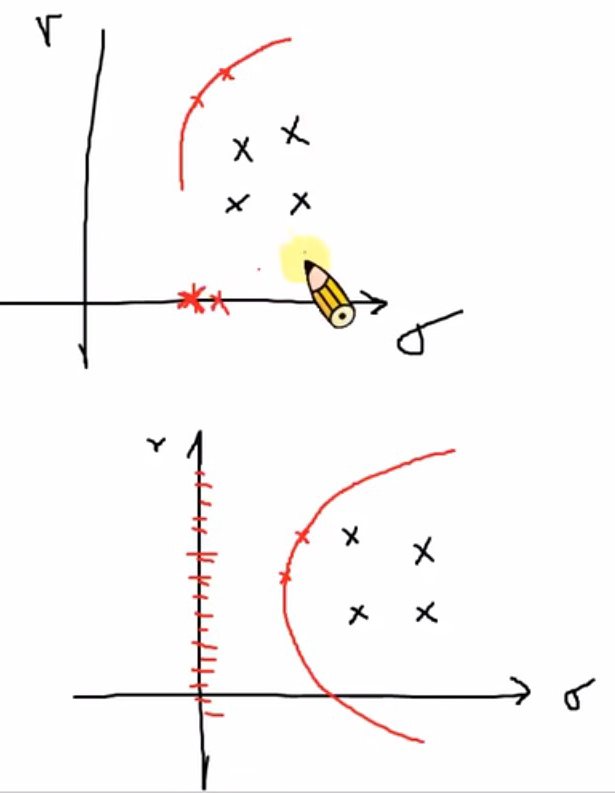

## 下面要画出有效边界(边界上的点都是一定程度上的最优解)有两种画法
## 1，走横轴，先固定一个波动率的值(限制式)，反求出在这一点上报酬率的极大值(加负号后的极小值)，同时可以求出取极值时4个变量的值，x和y轴坐标值确定下来了就可以在坐标轴上花点了，画出的点连一起就成了一条曲线，这就是对于这4个金融产品组成投资组合的投资有效边界。
## 2，走竖轴，先固定一个报酬率的值(限制式)，反求出在这一点上波动率的极小值，同时可以求出取极值时4个变量的值，x和y轴坐标值确定下来了就可以在坐标轴上花点了，画出的点连一起就成了一条曲线，这就是对于这4个金融产品组成投资组合的投资有效边界。
## 有效边界的思想就是，在任意报酬率下最小波动率，在任意波动率下最大的报酬率，在一定限制条件下，最大夏普指数的点组成的一条曲线。
## 因为有效边界画出的曲线类似于图2，有上下两个弧度，但是在投资组合领域的有效边界，在同等的波动率的情况下肯定要选出最高报酬率的值，所以必然是上面那个弧度的点得到保留。这个问题在用第一种方法时不会出现，因为是固定波动率来求最高的报酬率，所以y轴的取值必然是在那个点上的极大值，拟合出的曲线也必然只有上面一个半弧，得出的直接就是投资组合的有效边界。
## 得出的点实际上也是不同限制式值(固定x或y轴值)下效用函数曲线和有效边界曲线相切的点。

In [134]:
cons = ({'type': 'eq', 'fun': lambda x:  port_ret(x) - tret},
        {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})  

## port_ret(x) - tret，tret会是在y轴上的点(随机抽出n个)，port_ret(x) - tret = 0，就是port_ret(x) = tret，给定报酬率的值(只不过这个值在后面设定，是一组数据)。
## np.sum(x) - 1：权重加总等于1

In [135]:
bnds = tuple((0, 1) for x in weights)

## 权重是0到1之间

In [136]:
%%time
trets = np.linspace(0.05, 0.2, 50)
tvols = []
for tret in trets:
    res = sco.minimize(port_vol, eweights, method='SLSQP',
                       bounds=bnds, constraints = cons)  
    tvols.append(res['fun'])
tvols = np.array(tvols)

Wall time: 1.67 s


In [137]:
tvols.shape

(50,)

In [138]:
tvols

array([0.11198911, 0.11068712, 0.10983644, 0.10944758, 0.10947297,
       0.10969286, 0.11008001, 0.11063305, 0.11134938, 0.11222585,
       0.11325876, 0.11444387, 0.1157765 , 0.11725162, 0.11886393,
       0.12060837, 0.12247811, 0.12446845, 0.12657361, 0.12878784,
       0.13110569, 0.13352186, 0.13603043, 0.13862715, 0.14130693,
       0.14406512, 0.1468973 , 0.14979927, 0.15276706, 0.1557969 ,
       0.15888524, 0.1620288 , 0.16522477, 0.16846903, 0.17175966,
       0.17509422, 0.17846999, 0.18188458, 0.18533589, 0.18882214,
       0.19234281, 0.19593905, 0.19962547, 0.20339717, 0.20724919,
       0.21117744, 0.21517764, 0.21935776, 0.22394705, 0.22892911])

In [139]:
trets

array([0.05      , 0.05306122, 0.05612245, 0.05918367, 0.0622449 ,
       0.06530612, 0.06836735, 0.07142857, 0.0744898 , 0.07755102,
       0.08061224, 0.08367347, 0.08673469, 0.08979592, 0.09285714,
       0.09591837, 0.09897959, 0.10204082, 0.10510204, 0.10816327,
       0.11122449, 0.11428571, 0.11734694, 0.12040816, 0.12346939,
       0.12653061, 0.12959184, 0.13265306, 0.13571429, 0.13877551,
       0.14183673, 0.14489796, 0.14795918, 0.15102041, 0.15408163,
       0.15714286, 0.16020408, 0.16326531, 0.16632653, 0.16938776,
       0.17244898, 0.1755102 , 0.17857143, 0.18163265, 0.18469388,
       0.1877551 , 0.19081633, 0.19387755, 0.19693878, 0.2       ])

In [140]:
port_vol?

## tvols = []先开空list用来装结果，结果tvols是50个数值，这50个数值对应trets从0.05到0.2上取出的50个等差数列值.
## 因为trets是50个数值组成的数列，所以在算sco.minimize求极小值的时候需要for tret in trets，跑完所有cons，每算出一个极大值就tvols.append(res['fun'])，将极值取出(res结果本身是包括很多参数的，只取极值，不需要极值时4个变量的值等其他参数)，然后写入之前开出来的空lis： tvols里面，最后再np.array(tvols)将list做np.array化。
## sco.minimize求极小值，只不过和之前计算的不同，这个不是全局找一个极小值，而是在50个不同的限制条件下，求出各自对应的极值，然后将极值导出到一个np.array，方便后面画图和计算。
## 限制条件里面直接使用了之前定义好的port_ret(x)，但是计算极值的是port_vol, 但是设置限制式的原理一致，都是x(代表4个weights的值)经过一个函数的计算满足一定的条件(等于/不等于0), 只不过np.sum(x) - 1是使用numpy自带的函数，而port_ret(x)是之前定义的函数。
## sco.minimize括号里面第一个是function，constraints限制式里面第一个'fun':也是function。所以上面使用的计算函数书写方式是可以运行的。

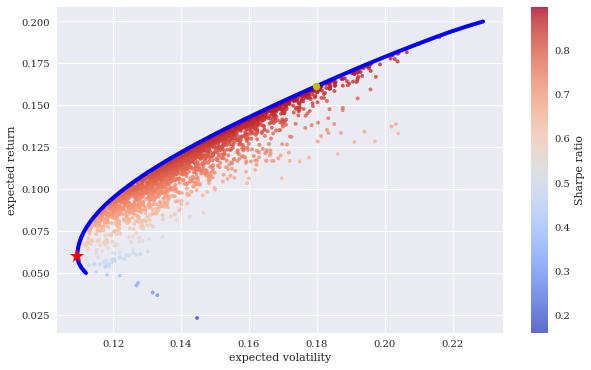

In [141]:
plt.figure(figsize=(10, 6))
plt.scatter(pvols, prets, c=prets / pvols,
            marker='.', alpha=0.8, cmap='coolwarm')
plt.plot(tvols, trets, 'b', lw=4.0)
plt.plot(port_vol(opts['x']), port_ret(opts['x']),
         'y.', markersize= 15.0)
plt.plot(port_vol(optv['x']), port_ret(optv['x']),
         'r*', markersize=15.0)
plt.xlabel('expected volatility')
plt.ylabel('expected return')
plt.colorbar(label='Sharpe ratio')
# plt.savefig('../../images/ch13/stat_13.png')

## 在生成散点图的基础上，通过plot,将上面算出的tvols, trets当做x和y值，拟合出曲线。
## port_vol(opts['x'])是将算出的weights(最佳风险收益比/最大夏普比率)带入计算波动率的函数里面，port_ret(opts['x'])是带入收益率的函数里面，算出坐标x和y的值，'y*' 是代表用黄色yellow的五角星来标记坐标点。(同理，下面的'r*' 就是红星)， markersize= 15.0是标记的大小。
## 红星代表的值是port_vol(optv['x'])和port_ret(optv['x'])，optv求的是最小波动率下的weights值。

# Capital Market Line资本市场线

## The line with an intercept point equal to the risk-free rate that is tangent to the efficient frontier of risky assets; represents the efficient frontier when a risk-free asset is available for investment.
## 资本市场线是表明有效组合的期望收益率和标准差之间的一种线性关系的一条由无风险收益率发出的射线。它与投资组合的有效边界相切，是由风险资产和无风险资产构成的投资组合。

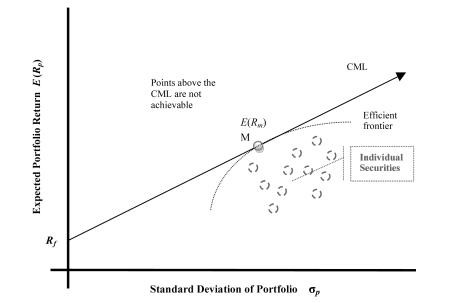

## 效用函数可分为三类：凹性效用函数、凸性效用函数、和线性效用函数，分别表示投资者对风险持风险回避态度、风险喜好和中性态度。

## 风险厌恶，如果是横轴和纵轴调换位置和前面画图一样，横轴是波动率(风险效用)，纵轴是货币收益率，图像就变成向右下角凸出的曲线。代表风险(波动率)随货币收益的增加而增加，但增加率递减，效用函数的二阶导数小于零。风险厌恶考将选择具有较大确定性而不是放小确定结果的投机方式。
## 相当于是收益越高越谨慎持有，更加偏向于增加波动率较低的产品在组合里面的比重。

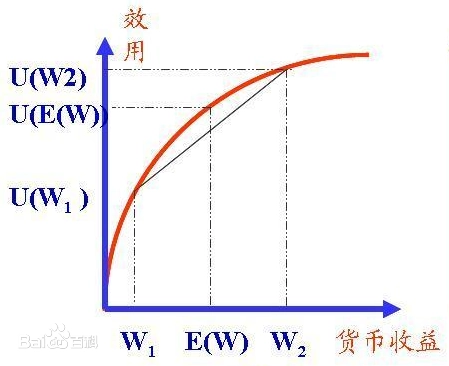

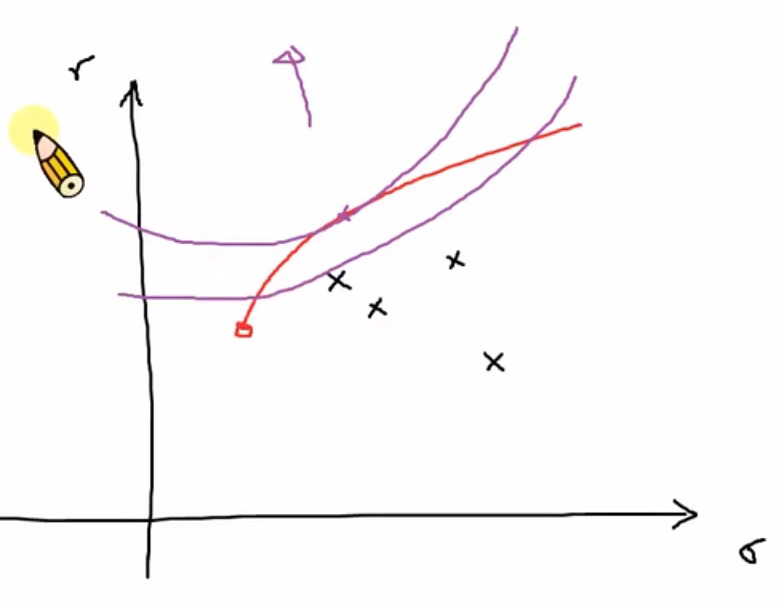

## 对于一个风险厌恶的效用曲线，从右下往上推移，直到和红线相切，取到效用曲线的最大值。
## 效用曲线可取在红线下(没有得到最大值，曲线代表的效用函数曲线没有达到最优情况)，但是不可以在红色有效边际线之上，因为有效边际已经是取出的最大的报酬率和波动率组成的，所以效用曲线最多和红线相切。

## 风险喜好性，随货币收益的增加，但增加率递增。效用函数的二阶导数大于零。当面临多种同样货币预期收益值的方式时，风险爱好者将选择具有较小确定性而不是较大确定结果的投机方式。

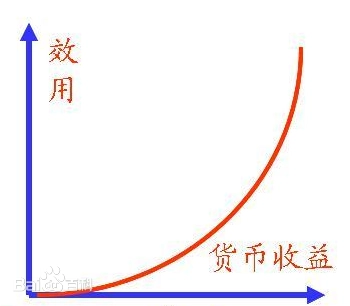

## 中性态度（见图3）表示效用随货币收益的增加，但增加率不变。效用函数的二阶导数等于零。 ，其中U为效用，M为货币收益，a和b是常数（b > 0）。
## 之前设定的风险中立的前提假设就假设所有投资人都是风险中立者，市场上的利率都是无风险利率，因此都是直线，也就是切线，本身的k也就是这个有效边界在某一点上的斜率(也是prets/pvols)。

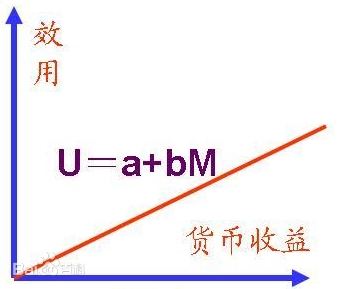

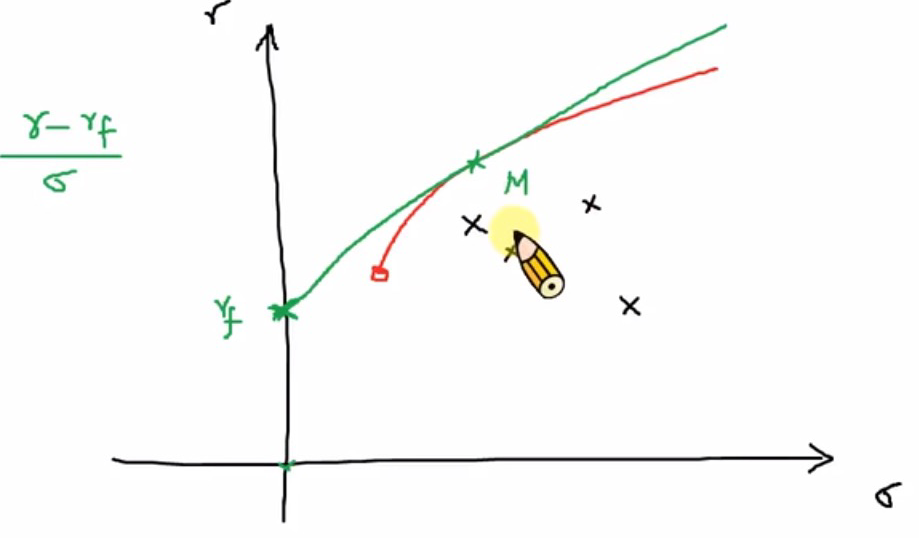

## 理论是从rf(无风险利率)点（p.s无风险一定程度上就是波动率σ为0，所以rf点的x值为0）向右边延伸出一条直线，当直线和红色曲线相切时代表的直线斜率的最大值(不能再往上抬了，这样会超出有效边界)，切线的斜率为(r - rf) / σ:标准夏普比率。
## 切点M是对于所以图中排列的资产在目前条件(rf)下的最优结果，因为线斜率越大就意味着(r - rf) / σ:标准夏普比率越大。如果排列的资产是整个市场上所有资产的集合，那么M点提供的是对于当前市场环境的最优组合的波动率和报酬率。同样的这条直线也叫Capital Market Line(CML)资本市场线。实务上往往采用的是一个国家或者行业内所以的资产(股票，债券或币制)作为加权的集合。
## 所以按这个理论，最优的解就是加权后的全国或者全行业加权组合，所以实际上，就是沪深300指数、标普500指数、纳斯达克100指数、日经225指数等指数基金(并不是选取所有资产，而是在这个交易所上市的所有股票中选择效益最好的500或1000支股票)从长期看是最高夏普指数的，选择指数基金是最稳妥和有收益的投资，因为线再往上抬(或者不取切点)就是更高的波动率或者更低的收益。

In [136]:
import scipy.interpolate as sci

In [161]:
ind = np.argmin(tvols)  
evols = tvols[ind:]  
erets = trets[ind:]  

In [162]:
tvols

array([0.11198911, 0.11068712, 0.10983644, 0.10944758, 0.10947297,
       0.10969286, 0.11008001, 0.11063305, 0.11134938, 0.11222585,
       0.11325876, 0.11444387, 0.1157765 , 0.11725162, 0.11886393,
       0.12060837, 0.12247811, 0.12446845, 0.12657361, 0.12878784,
       0.13110569, 0.13352186, 0.13603043, 0.13862715, 0.14130693,
       0.14406512, 0.1468973 , 0.14979927, 0.15276706, 0.1557969 ,
       0.15888524, 0.1620288 , 0.16522477, 0.16846903, 0.17175966,
       0.17509422, 0.17846999, 0.18188458, 0.18533589, 0.18882214,
       0.19234281, 0.19593905, 0.19962547, 0.20339717, 0.20724919,
       0.21117744, 0.21517764, 0.21935776, 0.22394705, 0.22892911])

## np.argmin是找出数组里面最小值，返回最小值所在的位置编号, 然后通过tvols[ind:]从tvols将比这个大的数取出(前提是数组答案是有序的，本身是由一个有序数组计算得到的)
## 目的是将最小值之后的点取出，切线在最小值处出现了一个拐点，拐点以上的才是投资的有效曲线，同样的波动率，肯定是寻找最大的报酬率，最大报酬率构成了上面的曲线。

In [165]:
tck = sci.splrep(evols, erets)  

## sci.splrep是用来做内插(splines)的函数, 输入x和y轴值，默认是做cubic splines(3次方内插)。
## 内插就是在点和点之间平滑地插入曲线，从总体上形成平滑的曲线，并且获得拟合出的函数式，如果不在函数里面表面，就会使用默认的cubic splines最多使用，而且效果最好(内插只能是奇数次方)。
## 之前可以通过plot用点近似画出曲线，但是不知道曲线方程式，而后面做切线的时候需要对切线求导，所以需要通过一定的方法拟合出曲线的函数表达式，splines是有点就可以做，没有太多的要求(多项式需要看上去相似于某一个多项式曲线的形式，准确性和泛用度都不高)。

In [173]:
import pandas as pd

In [177]:
array([0.10944758, 0.10944758, 0.10944758, 0.10944758, 0.10969286,
        0.11008001, 0.11063305, 0.11134938, 0.11222585, 0.11325876,
        0.11444387, 0.1157765 , 0.11725162, 0.11886393, 0.12060837,
        0.12247811, 0.12446845, 0.12657361, 0.12878784, 0.13110569,
        0.13352186, 0.13603043, 0.13862715, 0.14130693, 0.14406512,
        0.1468973 , 0.14979927, 0.15276706, 0.1557969 , 0.15888524,
        0.1620288 , 0.16522477, 0.16846903, 0.17175966, 0.17509422,
        0.17846999, 0.18188458, 0.18533589, 0.18882214, 0.19234281,
        0.19593905, 0.19962547, 0.20339717, 0.20724919, 0.21117744,
        0.21517764, 0.21935776, 0.22892911, 0.22892911, 0.22892911,
        0.22892911

(array([0.10944758, 0.10944758, 0.10944758, 0.10944758, 0.10969286,
        0.11008001, 0.11063305, 0.11134938, 0.11222585, 0.11325876,
        0.11444387, 0.1157765 , 0.11725162, 0.11886393, 0.12060837,
        0.12247811, 0.12446845, 0.12657361, 0.12878784, 0.13110569,
        0.13352186, 0.13603043, 0.13862715, 0.14130693, 0.14406512,
        0.1468973 , 0.14979927, 0.15276706, 0.1557969 , 0.15888524,
        0.1620288 , 0.16522477, 0.16846903, 0.17175966, 0.17509422,
        0.17846999, 0.18188458, 0.18533589, 0.18882214, 0.19234281,
        0.19593905, 0.19962547, 0.20339717, 0.20724919, 0.21117744,
        0.21517764, 0.21935776, 0.22892911, 0.22892911, 0.22892911,
        0.22892911]),
 array([0.05918367, 0.07054273, 0.06082628, 0.07127788, 0.07083661,
        0.07514943, 0.07767382, 0.08086119, 0.08383801, 0.08689314,
        0.08992981, 0.09297762, 0.0960237 , 0.09907511, 0.1021263 ,
        0.10517914, 0.10823306, 0.111288  , 0.11434291, 0.11739981,
        0.12045623, 0.1235

In [163]:
def f(x):
    ''' Efficient frontier function (splines approximation). '''
    return sci.splev(x, tck, der=0)
def df(x):
    ''' First derivative of efficient frontier function. '''
    return sci.splev(x, tck, der=1)

## sci.splev是用来计算splines的函数，输入要计算的x值(vol波动率值)，然后输入sci.splrep得出cubic splines的结果式，der=0是返回出值的导阶，如果为0就是0阶导，意味着直接返回拟合函数计算出的y(ret报酬率)；如果为1就是1阶导，意味着返回一阶导数值。
## 定义两个函数f(x)和df(x)(因为拟合一条切线就需要点值和一阶导值)，不需要调出sci.splev函数，直接返回点值和一阶导值。

In [167]:
sci.splev?

In [178]:
def equations(p, rf=0.01):
    eq1 = rf - p[0]  
    eq2 = rf + p[1] * p[2] - f(p[2])  
    eq3 = p[1] - df(p[2])  
    return eq1, eq2, eq3

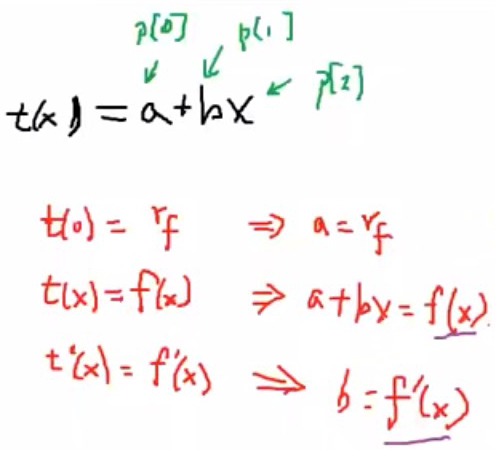

## 定义函数用来计算一元一次方程，同时规定了rf=0.01默认rf值为0.01，输入一组参数(包括a值，b值和x点值). 因为x点的位置也是不知道的，所以x点值也是未知数。

In [181]:
opt = sco.fsolve(equations, [0.01, 0.5, 0.15])  

## sco.fsolve解多元方程式，先输入function(包括要解的函数等式和需要解出来的变量值(把多个变量打包成一个list，写等式的时候用p[0]之类的切片形式表示))，然后输入起始值，rf默认值设为0.01所以起始值设定为0.01合理；最大的夏普指数(缺少一个-rf)值为0.5，所以斜率的初始值为0.5；x点值的起始值看上面点图里面标出的最大的夏普指数(缺少一个-rf)取的点x值为0.18，所以斜率的初始值为0.15。

In [182]:
opt  

array([0.01      , 0.84470952, 0.19525392])

## 结果和初始值很接近。(截距b, 斜率k, 切点的x值)

In [183]:
np.round(equations(opt), 6)  

array([ 0.,  0., -0.])

## 将opt(解出的3个变量值)带入3个等式，结果都是0。equations(opt)

In [185]:
y = opt[0] + opt[2] * opt[1]
y

0.1749328440043548

## 解出y值，就是在切点M(所有资产在目前条件(rf)下的最优排列结果)的y值，也是最优排列的报酬率。

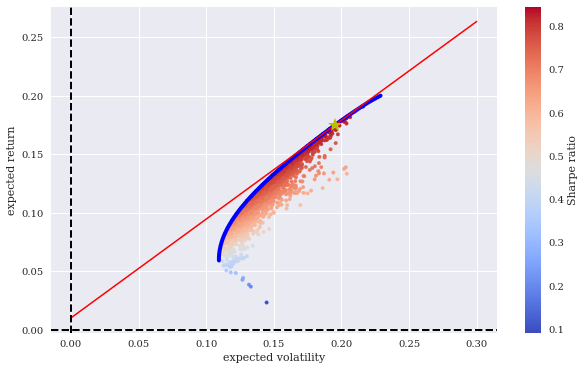

In [187]:
plt.figure(figsize=(10, 6))
plt.scatter(pvols, prets, c=(prets - 0.01) / pvols,
            marker='.', cmap='coolwarm')
plt.plot(evols, erets, 'b', lw=4.0)
cx = np.linspace(0.0, 0.3)
plt.plot(cx, opt[0] + opt[1] * cx, 'r', lw=1.5)
plt.plot(opt[2], f(opt[2]), 'y*', markersize = 15.0)
plt.grid(True)
plt.axhline(0, color='k', ls='--', lw=2.0)
plt.axvline(0, color='k', ls='--', lw=2.0)
plt.xlabel('expected volatility')
plt.ylabel('expected return')
plt.colorbar(label='Sharpe ratio')
# plt.savefig('../../images/ch13/stat_14.png')

## c=(prets - 0.01) / pvols， cmap确定color的值从没有考虑无风险利率rf的简单投资风险收益比变成了-rf的夏普比率。夏普比率就是colorbar上面的数值。
## cx = np.linspace(0.0, 0.3)，先从0到0.3将线的x轴区间开出来(一定要到0，因为线是从(0, 0.1)点延伸出来的)。
## plt.plot(cx, opt[0] + opt[1] * cx, 'r', lw=1.5)是按函数表达式画线，cx是x的定义域，后面是函数式：opt[0] + opt[1] * cx，主要用b和k两个变量，切点暂时不需要。红线，粗1.5.
## plt.plot(opt[2], f(opt[2]), 'y*', markersize = 15.0)标出切点，用之前算出来的切点的x值和x值带入切线函数式得到的f(opt[2])确定切点，用黄色五角星标注出来，大小15.
## plt.axhline(0, color='k', ls='--', lw=2.0)和axvline横纵轴在0的那条线用虚线的形式标注出来。
## 考虑rf会让整个点图和拟合出的曲线整体向上平移了一段，从图中看是效用更高了，实际中是因为考虑了rf，所以的报酬率都从rf(无风险利率)开始考虑，之前是从0开始。

In [188]:
cons = ({'type': 'eq', 'fun': lambda x:  port_ret(x) - f(opt[2])},
        {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})  
res = sco.minimize(port_vol, eweights, method='SLSQP',
                   bounds=bnds, constraints=cons)

In [189]:
res['x'].round(3)  

array([0.59 , 0.221, 0.189, 0.   ])

## 解极值问题，求在最优点M(切点)处的4个权重大小。
## port_ret(x) - f(opt[2])，使报酬率为f(opt[2])，求对应的最优vol(最小), res['x']看极值处的权重。

In [190]:
port_ret(res['x'])

0.1749328439781415

In [191]:
port_vol(res['x'])

0.19525372088294163

In [193]:
port_ret(res['x'] - 0.01) / port_vol(res['x'])

0.8723115569464917

## port_vol(res['x']) = 0.19525372088294163和前面解直线方程的x值一致
## port_vol(res['x']) = 0.1749328439781415和前面带入计算的直线的y值和f(opt[2])曲线对应的y值一致。
## port_ret(res['x'] - 0.01) / port_vol(res['x']) = 0.8723115569464917和切线斜率值一致。

<img src="http://hilpisch.com/tpq_logo.png" alt="The Python Quants" width="35%" align="right" border="0"><br>

<a href="http://tpq.io" target="_blank">http://tpq.io</a> | <a href="http://twitter.com/dyjh" target="_blank">@dyjh</a> | <a href="mailto:training@tpq.io">training@tpq.io</a>